In [78]:
# !pip install kgtk
# !!pip install faiss-gpu

In [1]:
import os
import os.path
import glob
import subprocess
import pandas as pd

from kgtk.configure_kgtk_notebooks import ConfigureKGTK
from kgtk.functions import kgtk

In [28]:
os.environ["CUDA_VISIBLE_DEVICES"] ="4"

In [2]:
input_path = "graph/in"
output_path = "graph/out"
project_name = "memes"

In [3]:
additional_files = {
    "imkg": "imkg.kgtk.gz", 
    "kym": "kym.kgtk.gz",
    "wiki": "wd_mini.kgtk.gz",
    "mappings": "mappings.kgtk.gz",
    "label": "labels.en.tsv.gz"
    
}

big_files = [
]

ck = ConfigureKGTK(big_files)
ck.configure_kgtk(input_graph_path=input_path, 
                  output_path=output_path, 
                  project_name=project_name,
                  additional_files=additional_files)

User home: /nas/home/syjoshi
Current dir: /nas/home/syjoshi/IMKG
KGTK dir: /nas/home/syjoshi
Use-cases dir: /nas/home/syjoshi/use-cases


In [4]:
ck.print_env_variables()

KGTK_OPTION_DEBUG: false
KGTK_GRAPH_CACHE: graph/out/memes/temp.memes/wikidata.sqlite3.db
OUT: graph/out/memes
KGTK_LABEL_FILE: graph/in/labels.en.tsv.gz
USE_CASES_DIR: /nas/home/syjoshi/use-cases
kgtk: kgtk
STORE: graph/out/memes/temp.memes/wikidata.sqlite3.db
kypher: kgtk query --graph-cache graph/out/memes/temp.memes/wikidata.sqlite3.db
GRAPH: graph/in
EXAMPLES_DIR: /nas/home/syjoshi/examples
TEMP: graph/out/memes/temp.memes
imkg: graph/in/imkg.kgtk.gz
kym: graph/in/kym.kgtk.gz
wiki: graph/in/wd_mini.kgtk.gz
mappings: graph/in/mappings.kgtk.gz
label: graph/in/labels.en.tsv.gz


In [5]:
ck.load_files_into_cache()

kgtk query --graph-cache graph/out/memes/temp.memes/wikidata.sqlite3.db -i "graph/in/imkg.kgtk.gz" --as imkg  -i "graph/in/kym.kgtk.gz" --as kym  -i "graph/in/wd_mini.kgtk.gz" --as wiki  -i "graph/in/mappings.kgtk.gz" --as mappings  -i "graph/in/labels.en.tsv.gz" --as label  --limit 3
input alias 'imkg' already in use


## KYM.kgtk.gz

How many memes do we have in the KYM graph itself?

In [9]:
%%time
!kgtk query -i $kym \
    --match '(n1)-[r:`rdf:type`]->(:`kym:Meme`)' \
    --return 'count(distinct n1)'

count(DISTINCT graph_5_c1."node1")
12585
CPU times: user 1.03 s, sys: 160 ms, total: 1.19 s
Wall time: 1min 5s


Sample rows in the graph set

In [10]:
%%time
!kgtk sample -i $kym \
    --input-size 100 --sample-size 5 --exact \
    --seed 23

node1	label	node2
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:added	nodeDW9ARPJSRQYEUQn4RyWQMF-16625
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q10770146
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q7363
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	rdfs:seeAlso	kym:gaysper
kym:%D0%B1%D1%83%D0%B4%D1%8C-%D0%BC%D1%83%D0%B6%D0%B8%D0%BA%D0%BE%D0%BC-%D0%B1%D0%BB%D0%B5%D0%B0%D1%82%D1%8C-be-a-man-bleat	rdf:type	kymt:exploitable
CPU times: user 101 ms, sys: 20 ms, total: 121 ms
Wall time: 5.9 s


Sample rows which are an instance of `kym:Meme`

In [13]:
%%time
!kgtk query -i $kym \
    --match '(n1)-[r]->(:`kym:Meme`)' \
    --limit 5

node1	label	node2
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	rdf:type	kym:Meme
kym:%D0%B1%D1%83%D0%B4%D1%8C-%D0%BC%D1%83%D0%B6%D0%B8%D0%BA%D0%BE%D0%BC-%D0%B1%D0%BB%D0%B5%D0%B0%D1%82%D1%8C-be-a-man-bleat	rdf:type	kym:Meme
kym:%D0%B2%D0%B8d-face-of-doom	rdf:type	kym:Meme
kym:%D0%BD%D0%B5%D1%82-no-poster	rdf:type	kym:Meme
kym:%D9%85%D8%AD%D9%8A-%D9%87%D9%88-%D8%A7%D9%84%D9%83%D9%88%D9%86%D8%AA%D8%B1%D8%A7%D8%B3%D9%8A%D8%A8%D8%B4%D9%86-%D9%88%D8%B1%D9%82%D8%A9-%D8%A3%D9%88%D9%84%D9%89-%D9%88%D9%84%D8%A7-%D8%AA%D8%A7%D9%86%D9%8A%D8%A9%D8%9F	rdf:type	kym:Meme
CPU times: user 79.9 ms, sys: 19.3 ms, total: 99.2 ms
Wall time: 4.5 s


Rows which are associated with `kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face` meme

In [17]:
%%time
!kgtk query -i $kym \
    --match '(:`kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face`)-[r]->(n2)' \
    --limit 100

node1	label	node2
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:about	( ͡° ͜ʖ ͡°) is an emoticon created with unicode character symbols. The face is often used to spam forums and image boards, similar to the Japanese word \desu\". On 4chan, it has also come to be known as \"Le Lenny Face\" or \"Le Face Face.\""
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:added	nodeDW9ARPJSRQYEUQn4RyWQMF-16625
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:from	Ylilauta
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromAbout	Q238330
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromAbout	Q28135014
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromAbout	Q31963
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromAbout	Q5287
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromAbout	Q8819
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q1027879
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q10770146
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q1101796
kym:%CD%A1-%CD%9C%CA%96-%CD%A

CPU times: user 46.7 ms, sys: 10.1 ms, total: 56.8 ms
Wall time: 2.49 s


In [35]:
%%time
!kgtk query -i $kym \
    --match '(n1)-[r:`m4s:fromImage`]->(n2)' \
    --limit 10

node1	label	node2
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q1027879
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q10770146
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q1101796
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q1139104
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q11563
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q1188265
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q1572966
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q160108
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q167270
kym:%CD%A1-%CD%9C%CA%96-%CD%A1-lenny-face	m4s:fromImage	Q17278
CPU times: user 82 ms, sys: 15.1 ms, total: 97.1 ms
Wall time: 4.52 s


In [36]:
%%time
!kgtk query -i $kym \
    --match '(n1)-[r:`m4s:notableExamples`]->(n2)' \
    --limit 10

node1	label	node2
CPU times: user 77.7 ms, sys: 19.3 ms, total: 97 ms
Wall time: 4.48 s


In [37]:
%%time
!kgtk query -i $kym \
    --match '(n1)-[r:`m4s:instanceOf`]->(n2)' \
    --limit 10

node1	label	node2
CPU times: user 37.1 ms, sys: 16.9 ms, total: 54 ms
Wall time: 2.58 s


In [39]:
%%time
!kgtk query -i $kym \
    --match '(n1)-[r:`m4s:fromCaption`]->(n2)' \
    --limit 10

node1	label	node2
CPU times: user 43.4 ms, sys: 13.3 ms, total: 56.7 ms
Wall time: 2.5 s


In [6]:
!kgtk unique -i $kym \
    --column label

node1	label	node2
m4s:about	count	7561
m4s:added	count	15142
m4s:from	count	12585
m4s:fromAbout	count	47455
m4s:fromImage	count	388579
m4s:last_update_source	count	15298
m4s:origin	count	7079
m4s:spread	count	6459
m4s:status	count	12585
m4s:structured_uri	count	30440
m4s:structured_value	count	30440
m4s:tag	count	73951
m4s:title	count	12585
m4s:year	count	11495
prefix_expansion	count	8
rdf:type	count	28939
rdfs:seeAlso	count	196594
skos:broader	count	8214
skos:narrower	count	9533


## IMKG.kgtk.gz

Number of rows

In [43]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r]->(n2)' \
    --return 'count(n1)'

count(graph_6_c1."node1")
16549810
CPU times: user 10.2 s, sys: 1.55 s, total: 11.7 s
Wall time: 11min 16s


Number of unique relations and count

In [47]:
!kgtk unique -i $imkg \
    --column label

node1	label	node2
P1001	count	550
P10019	count	3
P1002	count	3
P101	count	1510
P1013	count	1
P1018	count	1
P102	count	739
P10228	count	4
P10241	count	20
P1027	count	49
P1029	count	27
P103	count	3193
P1032	count	26
P1034	count	84
P1035	count	7
P1037	count	43
P1038	count	260
P1040	count	63
P10476	count	1
P1049	count	116
P105	count	1153
P1050	count	569
P1056	count	2343
P10568	count	3
P1057	count	1
P106	count	27605
P1060	count	6
P10606	count	1
P10607	count	7
P10624	count	6
P1066	count	117
P1068	count	7
P1071	count	102
P1072	count	184
P10726	count	1
P1073	count	93
P1074	count	21
P10741	count	13
P1079	count	12
P108	count	1173
P1080	count	837
P110	count	4
P111	count	60
P112	count	595
P113	count	35
P1136	count	1
P1137	count	1
P114	count	18
P1142	count	555
P115	count	89
P1158	count	12
P1165	count	44
P118	count	943
P119	count	208
P1192	count	7
P1196	count	1439
P1202	count	6
P121	count	290
P122	count	221
P123	count	1943
P126	count	43
P1268	count	57
P1269	count	1085
P127	count	1338
P1283	count	2
P

In [6]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`m4s:templateOf`]->(n2)' \
    --limit 10

node1	label	node2
imgflipr:memetemplate/100165392/All-Your-Bases-Are-Belong-To-Us	m4s:templateOf	kym:all-your-base-are-belong-to-us
imgflipr:memetemplate/102342948/Its-Caturday	m4s:templateOf	kym:caturday
imgflipr:memetemplate/10865431/forever-alone	m4s:templateOf	kym:forever-alone
imgflipr:memetemplate/10866054/crying-michael-jordan	m4s:templateOf	kym:crying-michael-jordan
imgflipr:memetemplate/110754417/grimdark-chrisy	m4s:templateOf	kym:grimdark
imgflipr:memetemplate/112067320/Distracted-boyfriend	m4s:templateOf	kym:distracted-boyfriend
imgflipr:memetemplate/112266915/Angry-German-kid	m4s:templateOf	kym:angry-german-kid-keyboard-crasher
imgflipr:memetemplate/115906422/meme-man	m4s:templateOf	kym:meme-man
imgflipr:memetemplate/116942025/Captain-obvious	m4s:templateOf	kym:captain-obvious
imgflipr:memetemplate/117284651/Crying-Michael-Jordan	m4s:templateOf	kym:crying-michael-jordan
CPU times: user 69.9 ms, sys: 18.9 ms, total: 88.8 ms
Wall time: 4.6 s


In [7]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`imgflipr:image_url`]->(n2)' \
    --limit 10

node1	label	node2
imgflipi:100035	imgflipr:image_url	https://i.imgflip.com/100035.jpg
imgflipi:10004t	imgflipr:image_url	https://i.imgflip.com/10004t.jpg
imgflipi:1000ba	imgflipr:image_url	https://i.imgflip.com/1000ba.jpg
imgflipi:1000qw	imgflipr:image_url	https://i.imgflip.com/1000qw.jpg
imgflipi:1000yv	imgflipr:image_url	https://i.imgflip.com/1000yv.jpg
imgflipi:100151	imgflipr:image_url	https://i.imgflip.com/100151.jpg
imgflipi:1001j9	imgflipr:image_url	https://i.imgflip.com/1001j9.jpg
imgflipi:1001k2	imgflipr:image_url	https://i.imgflip.com/1001k2.jpg
imgflipi:1001pz	imgflipr:image_url	https://i.imgflip.com/1001pz.jpg
imgflipi:1001s4	imgflipr:image_url	https://i.imgflip.com/1001s4.jpg
CPU times: user 35.2 ms, sys: 17.5 ms, total: 52.8 ms
Wall time: 2.63 s


In [8]:
%%time
!kgtk query -i $imkg \
    --match '(n1:`imgflipi:100035`)-[r]->(n2)' 

node1	label	node2
imgflipi:100035	imgflipr:alt_text	I Should Buy A Boat Cat \|  I SHOULD WATCH MAD MAX FURY ROAD \| image tagged in memes,i should buy a boat cat,AdviceAnimals \| made w/ Imgflip meme maker
imgflipi:100035	imgflipr:image_url	https://i.imgflip.com/100035.jpg
imgflipi:100035	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:100035	imgflipr:templateId	1367068
imgflipi:100035	imgflipr:template_title	I Should Buy A Boat Cat
imgflipi:100035	imgflipr:title	After watching the Oscars for 20 minutes and see mad max won 6/7 nominations I\'ve seen.
imgflipi:100035	imgflipr:upvote_count	1
imgflipi:100035	imgflipr:view_count	2,437
imgflipi:100035	m4s:fromCaption	Q3275141
CPU times: user 47.7 ms, sys: 16 ms, total: 63.7 ms
Wall time: 3.08 s


In [9]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`imgflipr:template`]->(n2)' \
    --return 'count(distinct n1)'

count(DISTINCT graph_6_c1."node1")
1326032
CPU times: user 221 ms, sys: 51.8 ms, total: 273 ms
Wall time: 15.8 s


In [10]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`imgflipr:template`]->(n2)' \
    --return 'count(n1)'

count(graph_6_c1."node1")
1326032
CPU times: user 75.4 ms, sys: 21 ms, total: 96.4 ms
Wall time: 5.17 s


In [11]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`imgflipr:template`]->(n2)' \
    --return 'count(distinct n2)'

count(DISTINCT graph_6_c1."node2")
1765
CPU times: user 88.3 ms, sys: 21 ms, total: 109 ms
Wall time: 6.3 s


In [12]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`imgflipr:template`]->(n2)' \
    --return 'count(n2)'

count(graph_6_c1."node2")
1326032
CPU times: user 66.8 ms, sys: 21 ms, total: 87.8 ms
Wall time: 5.12 s


In [13]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`imgflipr:template`]->(n2)' \
    --limit 10

node1	label	node2
imgflipi:100035	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:10004t	imgflipr:template	imgflipmeme:Third-World-Success-Kid
imgflipi:1000ba	imgflipr:template	imgflipmeme:10-Guy
imgflipi:1000qw	imgflipr:template	imgflipmeme:Back-In-My-Day
imgflipi:1000yv	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:100151	imgflipr:template	imgflipmeme:Picard-Wtf
imgflipi:1001j9	imgflipr:template	imgflipmeme:Leonardo-Dicaprio-Cheers
imgflipi:1001k2	imgflipr:template	imgflipmeme:40181531/Donald-Trump
imgflipi:1001pz	imgflipr:template	imgflipmeme:40181531/Donald-Trump
imgflipi:1001s4	imgflipr:template	imgflipmeme:Leonardo-Dicaprio-Cheers
CPU times: user 41.9 ms, sys: 14.3 ms, total: 56.2 ms
Wall time: 2.61 s


## imgflipmeme:I-Should-Buy-A-Boat-Cat

In [13]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`imgflipr:template`]->(n2)' \
    --where 'n2="imgflipmeme:I-Should-Buy-A-Boat-Cat"' \
    --limit 10

node1	label	node2
imgflipi:100035	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:100njz	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:100zxi	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:104e7r	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:10678a	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:10ipq8	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:10qnah	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:10wtyc	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:10x6nx	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
imgflipi:116ta6	imgflipr:template	imgflipmeme:I-Should-Buy-A-Boat-Cat
CPU times: user 198 ms, sys: 47.3 ms, total: 245 ms
Wall time: 12 s


In [14]:
%%time
!kgtk query -i $imkg \
    --match '(n1:`imgflipi:100035`)-[r:`imgflipr:image_url`]->(n2)'

node1	label	node2
imgflipi:100035	imgflipr:image_url	https://i.imgflip.com/100035.jpg
CPU times: user 179 ms, sys: 34.8 ms, total: 213 ms
Wall time: 10.7 s


In [15]:
%%time
!kgtk query -i $imkg \
    --match '(n1:`imgflipi:100njz`)-[r:`imgflipr:image_url`]->(n2)'

node1	label	node2
imgflipi:100njz	imgflipr:image_url	https://i.imgflip.com/100njz.jpg
CPU times: user 64.6 ms, sys: 24.6 ms, total: 89.1 ms
Wall time: 4.6 s


In [16]:
%%time
!kgtk query -i $imkg \
    --match '(n1:`imgflipi:100zxi`)-[r:`imgflipr:image_url`]->(n2)'

node1	label	node2
imgflipi:100zxi	imgflipr:image_url	https://i.imgflip.com/100zxi.jpg
CPU times: user 72.9 ms, sys: 20.8 ms, total: 93.7 ms
Wall time: 5.28 s


## imgflipmeme:One-Does-Not-Simply

In [6]:
%%time
!kgtk query -i $imkg \
    --match '(n1)-[r:`imgflipr:template`]->(n2)' \
    --where 'n2="imgflipmeme:One-Does-Not-Simply"' \
    --limit 10

node1	label	node2
imgflipi:1000yv	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:1005qb	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:1006ve	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:100fhk	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:100ksx	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:100m3s	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:100nb9	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:100nre	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:100o26	imgflipr:template	imgflipmeme:One-Does-Not-Simply
imgflipi:100u6q	imgflipr:template	imgflipmeme:One-Does-Not-Simply
CPU times: user 165 ms, sys: 51.3 ms, total: 217 ms
Wall time: 12 s


In [7]:
%%time
!kgtk query -i $imkg \
    --match '(n1:`imgflipi:1000yv`)-[r:`imgflipr:image_url`]->(n2)'

node1	label	node2
imgflipi:1000yv	imgflipr:image_url	https://i.imgflip.com/1000yv.jpg
CPU times: user 8.04 s, sys: 1.56 s, total: 9.6 s
Wall time: 8min 58s


In [8]:
%%time
!kgtk query -i $imkg \
    --match '(n1:`imgflipi:1005qb`)-[r:`imgflipr:image_url`]->(n2)'

node1	label	node2
imgflipi:1005qb	imgflipr:image_url	https://i.imgflip.com/1005qb.jpg
CPU times: user 77.8 ms, sys: 18.1 ms, total: 95.9 ms
Wall time: 4.64 s


In [9]:
%%time
!kgtk query -i $imkg \
    --match '(n1:`imgflipi:1006ve`)-[r:`imgflipr:image_url`]->(n2)'

node1	label	node2
imgflipi:1006ve	imgflipr:image_url	https://i.imgflip.com/1006ve.jpg
CPU times: user 35.7 ms, sys: 12.4 ms, total: 48.1 ms
Wall time: 2.44 s


## Create class specific directories and populate image_urls

In [9]:
%%time
!kgtk query -i $imkg --match '(n1)-[r:`imgflipr:template`]->(n2)' --out 'graph/out/imkg_templates.tsv' 

CPU times: user 180 ms, sys: 24.3 ms, total: 205 ms
Wall time: 11 s


In [53]:
templates_df = pd.read_csv('graph/out/imkg_templates.tsv', sep='\t')
templates = list(set(templates_df['node2']))

### Single instance

In [ ]:
tsv = pd.DataFrame(columns=["node1", "label", "node2"])
train_df = pd.DataFrame(columns=["node1", "label", "node2"])
test_df = pd.DataFrame(columns=["node1", "label", "node2"])
temp_set = set()
for temp in tqdm(templates):
    temp_rows = list(templates_df[templates_df['node2']==temp]['node1'])
    for val in temp_rows:
        url = "https://i.imgflip.com/{}.jpg".format(val.split(':')[-1])
        tsv.loc[len(tsv)] = [url, "template", temp]
        if temp not in temp_set:
            temp_set.add(temp)
            train_df.loc[len(train_df)] = [url, "template", temp]
        else:
            test_df.loc[len(test_df)] = [url, "template", temp]
tsv.to_csv('graph/out/dataset.tsv', sep='\t', index=False)
train_df.to_csv('graph/out/train.tsv', sep='\t', index=False)
test_df.to_csv('graph/out/test.tsv', sep='\t', index=False)

  9%|████████████▏                                                                                                                               | 154/1765 [14:24<1:50:50,  4.13s/it]

### Multiple instance

In [55]:
train_df = pd.DataFrame(columns=["node1", "label", "node2"])
temp_dict = {}
for temp in tqdm(templates):
    temp_rows = list(templates_df[templates_df['node2']==temp]['node1'])
    for val in temp_rows:
        url = "https://i.imgflip.com/{}.jpg".format(val.split(':')[-1])
        if temp not in temp_dict:
            temp_dict[temp] = 0
        if temp_dict[temp] < 3:
            temp_dict[temp] += 1
            train_df.loc[len(train_df)] = [url, "template", temp]
        else:
            pass
train_df.to_csv('graph/out/train_multipleinstances.tsv', sep='\t', index=False)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1765/1765 [02:26<00:00, 12.03it/s]


## Faiss Index with Cosine Similarity Metric and Encode Images 

In [2]:
import random
import torch
import requests
import faiss
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image
from transformers import AutoProcessor, Blip2Model
from sklearn.decomposition import IncrementalPCA
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
train_df = pd.read_csv('graph/out/train_multipleinstances.tsv', sep='\t')

In [4]:
train_df.head()

,node1,label,node2
0,https://i.imgflip.com/169270.jpg,template,imgflipmeme:Grumpy-Cat-Not-Amused
1,https://i.imgflip.com/1b6gtx.jpg,template,imgflipmeme:Grumpy-Cat-Not-Amused
2,https://i.imgflip.com/1e6ghk.jpg,template,imgflipmeme:Grumpy-Cat-Not-Amused
3,https://i.imgflip.com/1v7crh.jpg,template,imgflipmeme:Sad-Pablo-Escobar
4,https://i.imgflip.com/1ysavh.jpg,template,imgflipmeme:Sad-Pablo-Escobar


In [5]:
img_urls = list(train_df['node1'])
img_name = list(train_df['node1'])
img_category = list(train_df['node2'])
len(img_urls)

5279

In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [7]:
processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2Model.from_pretrained("Salesforce/blip2-opt-2.7b").to(device)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [8]:
img_features = []
real_img_name = []
real_img_category = []
cnt = 0
for name, url, cat in tqdm(zip(img_name, img_urls, img_category)):
    try:
        image = Image.open(requests.get(url, stream=True).raw)
        inputs = processor(images=image, return_tensors="pt")
        inputs = {name: tensor.to(device) for name, tensor in inputs.items()} 
        with torch.no_grad():
            outputs = model.get_image_features(**inputs)
            ftr = outputs.last_hidden_state
            ftr = ftr.view(ftr.shape[0], -1)   
            img_features.append(ftr.cpu().numpy()) 
            real_img_name.append(name)
            real_img_category.append(cat)
    except:
        pass
    if cnt == 1100:
        break
    cnt+=1

1100it [03:41,  4.97it/s]


In [11]:
img_features[0].shape

(1, 361856)

In [12]:
img_features2 = np.concatenate(img_features)  

In [13]:
img_features2.shape

(1098, 361856)

In [ ]:
pca = IncrementalPCA(n_components=1024) 
reduced_features = pca.fit_transform(img_features)

In [11]:
# img_features = []
# real_img_name = []
# real_img_category = []
# for name, url, cat in  tqdm(zip(img_name, img_urls, img_category)):
#     try:
#         image = Image.open(requests.get(url, stream=True).raw)
#         inputs = processor(images=image, return_tensors="pt")
#         inputs = {name: tensor.to(device) for name, tensor in inputs.items()} 
#         with torch.no_grad():
#             outputs = model.get_image_features(**inputs)
#             ftr = outputs.last_hidden_state
#             img_features.append(ftr)
#             real_img_name.append(name)
#             real_img_category.append(cat)
#     except:
#         pass
# features = torch.cat(img_features, dim=0).to('cpu') 

In [19]:
num_samples = len(img_features)
features = img_features2.reshape(num_samples, -1)
features_np = features

In [20]:
len(img_features)

1098

In [21]:
features_np.shape

(1098, 361856)

In [22]:
dimension = features_np.shape[1]
# index = faiss.IndexFlatL2(dimension)
index = faiss.index_factory(dimension, "Flat", faiss.METRIC_INNER_PRODUCT)

In [23]:
faiss.normalize_L2(features_np)

In [24]:
index.add(features_np)

In [25]:
len(real_img_name), len(real_img_category), len(features_np), len(img_features)

(1098, 1098, 1098, 1098)

In [26]:
data_dict1 = {}
for i in range(len(real_img_name)):
    data_dict1[real_img_name[i]] = features_np[i]
    
data_dict2 = {}
for i in range(len(real_img_category)):
    data_dict2[i] = real_img_category[i]
    
data_dict3 = {}
for i in range(len(real_img_name)):
    data_dict3[i] = real_img_name[i]

In [27]:
faiss.write_index(index, 'graph/out/blip2_imkg_index.index')
np.save('graph/out/blip2_imkg_img_index_dict.npy', data_dict1)
np.save('graph/out/blip2_imkg_img_category_index_dict.npy', data_dict2)
np.save('graph/out/blip2_imkg_img_url_index_dict.npy', data_dict3)

## Load Index and Inference

In [48]:
index = faiss.read_index('graph/out/blip2_imkg_index.index')
index_dict = np.load('graph/out/blip2_imkg_img_index_dict.npy', allow_pickle=True).item()
category_index_dict = np.load('graph/out/blip2_imkg_img_category_index_dict.npy', allow_pickle=True).item()
url_index_dict = np.load('graph/out/blip2_imkg_img_url_index_dict.npy', allow_pickle=True).item()

In [51]:
test_df = pd.read_csv('graph/out/test.tsv', sep='\t')
rn = random.sample(range(test_df.shape[0]), 100)
k = 1
acc = 0
total = 0
sample_test = []
for i in tqdm(range(len(rn))):
    try:
        img_url = test_df.iloc[rn[i]]['node1']
        img_class = test_df.iloc[rn[i]]['node2']
        image = Image.open(requests.get(img_url, stream=True).raw)
        inputs = processor(images=image, return_tensors="pt")
        with torch.no_grad():
            outputs = model(**inputs)
            ftr = outputs.last_hidden_state
        ftr = ftr.reshape(1, -1)
        ftr_np = ftr.detach().cpu().numpy()
        D, I = index.search(np.expand_dims(ftr_np[0], axis=0), k)
        actual_class = img_class
        predicted_class = category_index_dict[I[0][0]]
        if actual_class == predicted_class:
            acc += 1
        total += 1
        sample_test.append((img_url, url_index_dict[I[0][0]]))
    except:
        pass

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:49<00:00,  2.02it/s]


In [52]:
print("Accuracy: {}".format(acc/total))

Accuracy: 0.89


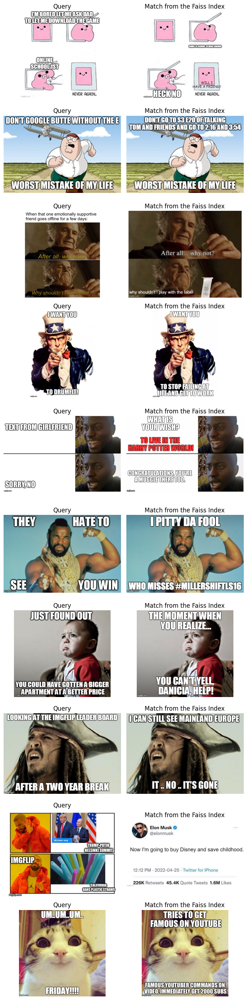

In [53]:
sample_test = sample_test[:10]
nrows, ncols = len(sample_test), 2
fig, axes = plt.subplots(nrows, ncols, figsize=(7, 28))
for i, (url1, url2) in enumerate(sample_test):
    image1 = Image.open(requests.get(url1, stream=True).raw)
    image2 = Image.open(requests.get(url2, stream=True).raw)
    axes[i, 0].imshow(image1)
    axes[i, 0].set_title("Query")
    axes[i, 0].axis('off')
    axes[i, 1].imshow(image2)
    axes[i, 1].set_title("Match from the Faiss Index")
    axes[i, 1].axis('off')
plt.tight_layout()
plt.show()

## Inference on Reddit Data

In [28]:
index = faiss.read_index('graph/out/blip2_imkg_index.index')
index_dict = np.load('graph/out/blip2_imkg_img_index_dict.npy', allow_pickle=True).item()
category_index_dict = np.load('graph/out/blip2_imkg_img_category_index_dict.npy', allow_pickle=True).item()
url_index_dict = np.load('graph/out/blip2_imkg_img_url_index_dict.npy', allow_pickle=True).item()

In [17]:
processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2Model.from_pretrained("Salesforce/blip2-opt-2.7b").to(device)

In [29]:
# get all csv files and then concatenate all images for encoding purpose
directory_path = "./data/files"
csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
all_test_images = []
for file in tqdm(csv_files):
    test_df = pd.read_csv(file)
    test_urls = list(test_df['image_location'].values)
    test_url = [x for x in test_urls if pd.notnull(x)]
    all_test_images.append(test_url)
all_test_images = [item for sublist in all_test_images for item in sublist]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 53.25it/s]


In [30]:
len(all_test_images)

13188

In [45]:
test_images = all_test_images[:1000]
k = 1
sample_test = []
for i in tqdm(range(len(test_images))):
    img_loc = test_images[i]
    image = Image.open(img_loc)
    if test_images[i].endswith(".gif"):
        image = image.convert("RGB")
    inputs = processor(images=image, return_tensors="pt")
    inputs = {name: tensor.to(device) for name, tensor in inputs.items()} 
    with torch.no_grad():
        outputs = model.get_image_features(**inputs)
        ftr = outputs.last_hidden_state
    ftr = ftr.to('cpu') 
    ftr = ftr.reshape(1, -1)
    ftr_np = ftr.detach().cpu().numpy()
    faiss.normalize_L2(ftr_np)
    D, I = index.search(np.expand_dims(ftr_np[0], axis=0), k)
    sample_test.append((img_loc, url_index_dict[I[0][0]], D))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [04:34<00:00,  3.65it/s]


In [46]:
len(sample_test)

1000

In [47]:
val1 = [x[0] for x in sample_test]
val2 = [x[1] for x in sample_test]
val3 = [x[2] for x in sample_test]

In [135]:
# nrows, ncols = 10, 2
# fig, axes = plt.subplots(nrows, ncols, figsize=(20, 50))
# image1, image2 = "", "" 
# for i in range(10):
#     if pd.notna(val1[i]):
#         image1 = Image.open(val1[i])
#         axes[i, 0].imshow(image1)
#         axes[i, 0].axis('off')
#     if pd.notna(val2[i]):
#         image2 = Image.open(requests.get(val2[i], stream=True).raw)
#         axes[i, 1].imshow(image2)
#         axes[i, 1].axis('off')
    
# plt.tight_layout()
# plt.show()

In [48]:
reddit_inference_df = pd.DataFrame(columns=["reddit image", "imkg image", "score"])

In [49]:
for x, y, z in tqdm(zip(val1, val2, val3)):
    reddit_inference_df.loc[len(reddit_inference_df)] = [x, y, z[0][0]]
    
reddit_inference_df.to_csv('./out/blip2_reddit_inference.csv')

1000it [00:00, 1114.33it/s]


In [50]:
reddit_inference_df.head()

,reddit image,imkg image,score
0,./data/wholesomememes/aydzuv8alm9b1.jpg,https://i.imgflip.com/4bucey.jpg,0.223794
1,./data/wholesomememes/5d1kz3fwfm9b1.png,https://i.imgflip.com/13o2zr.jpg,0.231610
2,./data/wholesomememes/g7juusas7m9b1.jpg,https://i.imgflip.com/12sglr.jpg,0.195029
3,./data/wholesomememes/9ef1tfkql5c31.jpg,https://i.imgflip.com/2tj52h.jpg,0.188116
4,./data/wholesomememes/l5yk2qpc6m9b1.png,https://i.imgflip.com/1rbyn2.jpg,0.193682


In [51]:
reddit_inference_df.shape

(1000, 3)

## Filter data by score

In [52]:
reddit_inference_df = pd.read_csv('./out/blip2_reddit_inference.csv', index_col=0)

In [53]:
def filter_data(df, filter_score):
    filtered_df = df[df['score']>=filter_score]
    filtered_df.reset_index(drop=True, inplace=True)
    return filtered_df

In [72]:
filter_score = 0.25
filtered_df_50 = filter_data(reddit_inference_df, filter_score)
filtered_df_50.to_csv('./out/blip2_filtered_df_50.csv')
filtered_df_50.shape

(153, 3)

In [73]:
filter_score = 0.70
filtered_df_70 = filter_data(reddit_inference_df, filter_score)
filtered_df_70.to_csv('./out/blip2_filtered_df_70.csv')
filtered_df_70.shape

(0, 3)

In [74]:
filter_score = 0.90
filtered_df_90 = filter_data(reddit_inference_df, filter_score)
filtered_df_90.to_csv('./out/blip2_filtered_df_90.csv')
filtered_df_90.shape

(0, 3)

## Plot filtered data - potential match

In [75]:
def plot_match_data(max_len, images1, images2):
    nrows, ncols = min(10, max_len), 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 50))
    image1, image2 = "", "" 
    for i in range(min(10, max_len)):
        image1 = Image.open(images1[i])
        axes[i, 0].imshow(image1)
        axes[i, 0].axis('off')
        image2 = Image.open(requests.get(images2[i], stream=True).raw)
        axes[i, 1].imshow(image2)
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

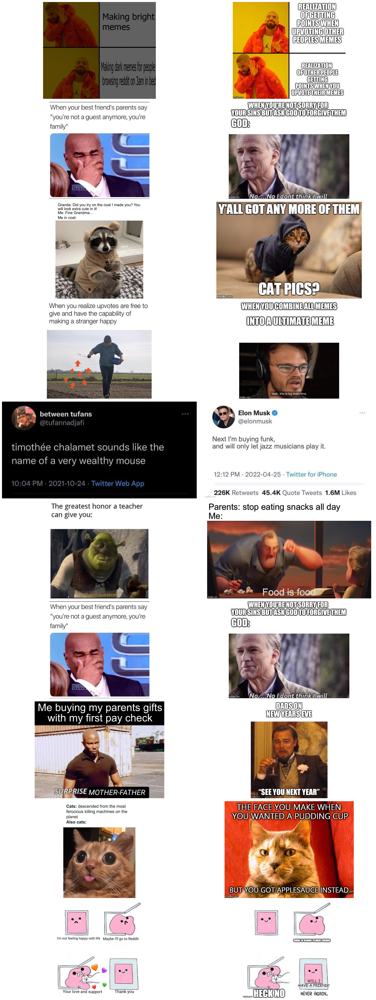

In [76]:
filtered_df = pd.read_csv('./out/blip2_filtered_df_50.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)

In [77]:
filtered_df = pd.read_csv('./out/blip2_filtered_df_70.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)

In [78]:
filtered_df = pd.read_csv('./out/blip2_filtered_df_90.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)